In [21]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [22]:
from math import sqrt, exp

import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

Q1)

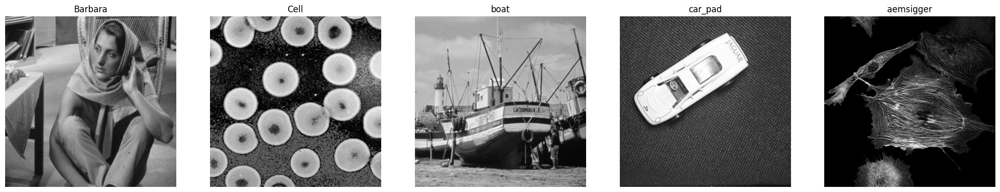

In [75]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

def plot_images(images, titles):
    num_images = len(images)
    fig, axes = plt.subplots(1, num_images, figsize=(5*num_images, 5))

    for ax, image, title in zip(axes, images, titles):
        grayscale_image = np.array(image.convert('L'))

        ax.imshow(grayscale_image, cmap='gray')
        ax.set_title(title)
        ax.axis('off')



    plt.show()

images = ['/content/barbara.png', '/content/cells.png', '/content/boats.png', '/content/car_pad.png', '/content/cell-aemisegger.png']
titles = ['Barbara', 'Cell', 'boat', 'car_pad', 'aemsigger']

loaded_images = [Image.open(image_path) for image_path in images]

plot_images(loaded_images, titles)


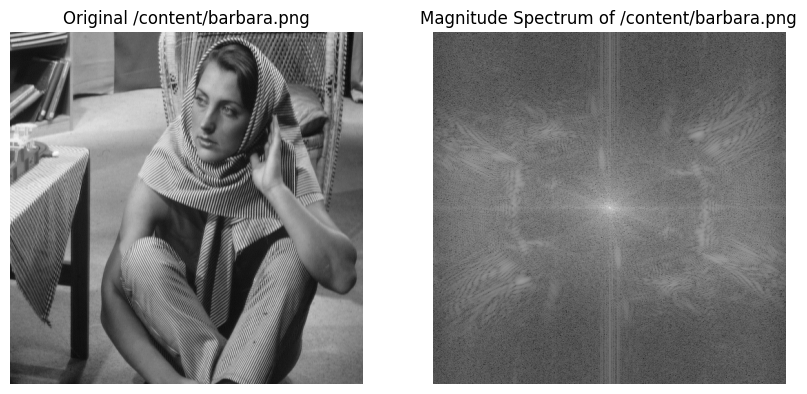

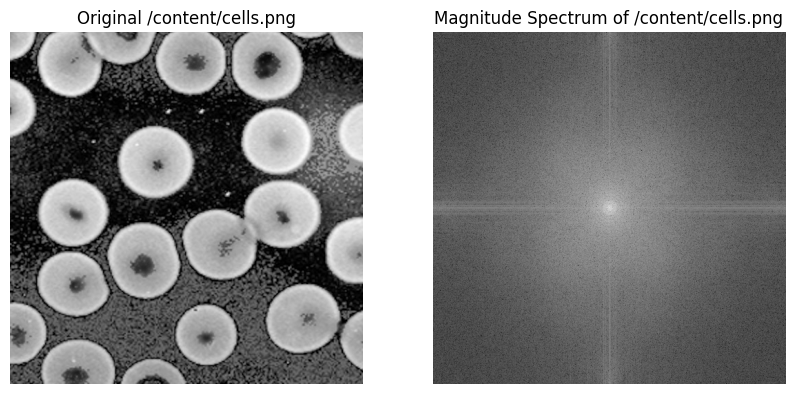

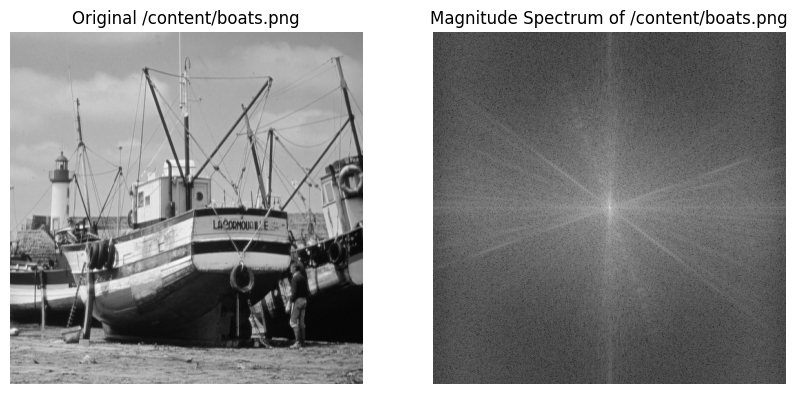

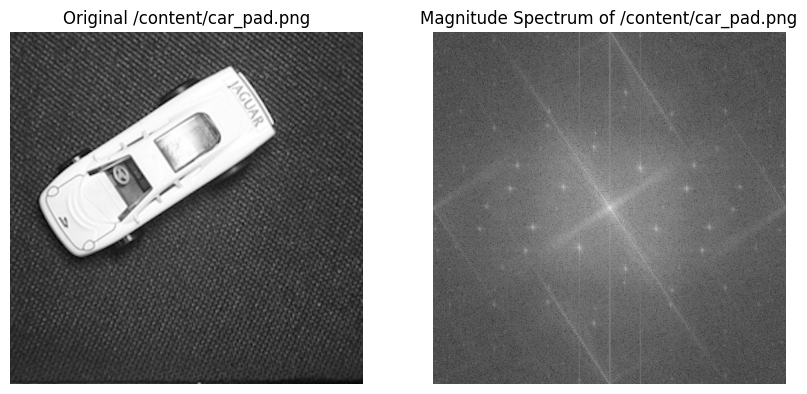

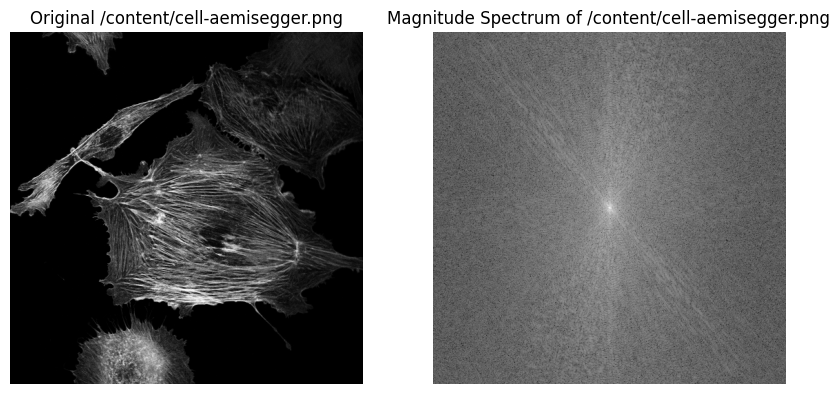

In [76]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt


def plot_figure(images, titles, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(10, 5))

    for ax, img, title in zip(axes.flat, images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    plt.show()

images = ['/content/barbara.png', '/content/cells.png', '/content/boats.png', '/content/car_pad.png', '/content/cell-aemisegger.png']

for i in range(len(images)):
    image = Image.open(images[i]).convert('L')
    fourier_transform = np.fft.fft2(image)
    center_shift = np.fft.fftshift(fourier_transform)
    magnitude_spectrum = display_freq(center_shift)

    plot_figure([image, magnitude_spectrum],
                [f'Original {images[i]}', f'Magnitude Spectrum of {images[i]}'],
                1, 2)


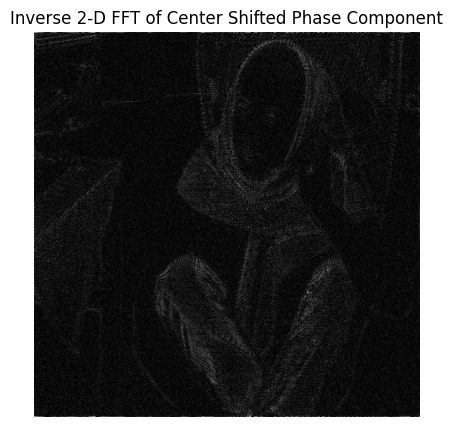

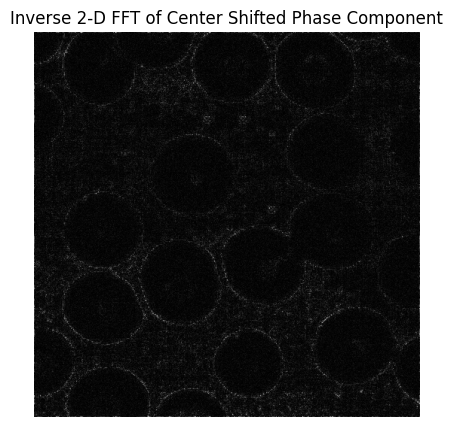

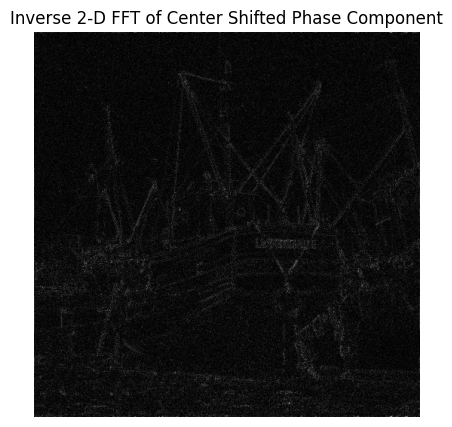

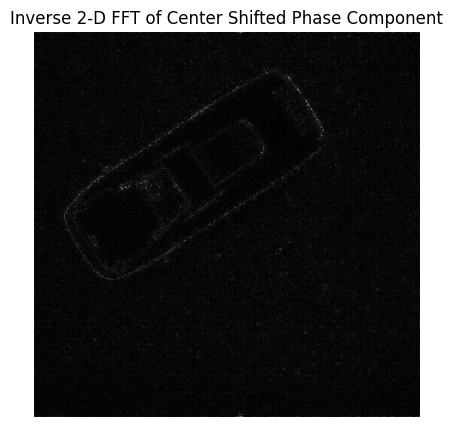

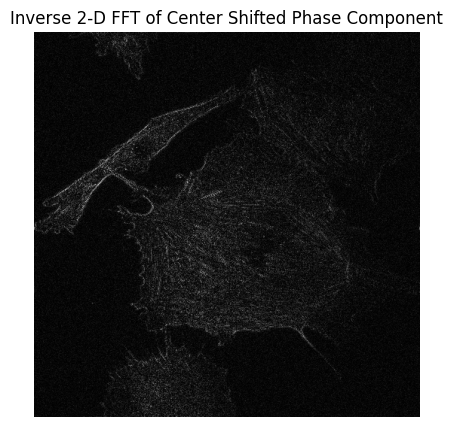

In [77]:
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

def display_freq(frequency_data):
    magnitude_spectrum = np.log(np.abs(frequency_data) + 1)
    return magnitude_spectrum

def plot_figure(images, titles, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(10, 5))

    if rows == 1 and cols == 1:
        axes = [axes]

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    plt.show()

images = ['/content/barbara.png', '/content/cells.png', '/content/boats.png', '/content/car_pad.png', '/content/cell-aemisegger.png']

for i in range(len(images)):
    image = Image.open(images[i]).convert('L')

    dft = np.fft.fft2(image)

    center_shifted = np.fft.fftshift(dft)

    phase = np.angle(center_shifted)

    ifft_phase = np.fft.ifft2(np.exp(1j * phase))

    plot_figure([np.abs(ifft_phase)], [f'Inverse 2-D FFT of Center Shifted Phase Component'], 1, 1)


Q2

<ipython-input-79-5466095047d4>:20: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_value = psnr(original, filtered)


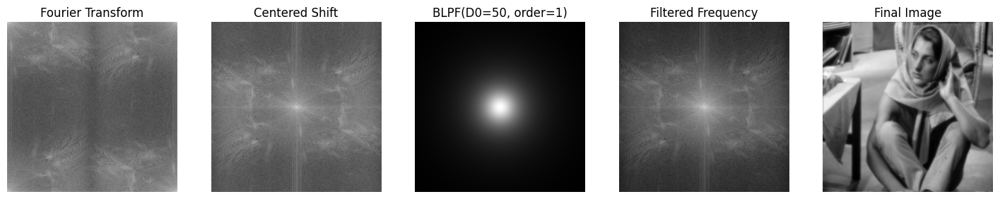

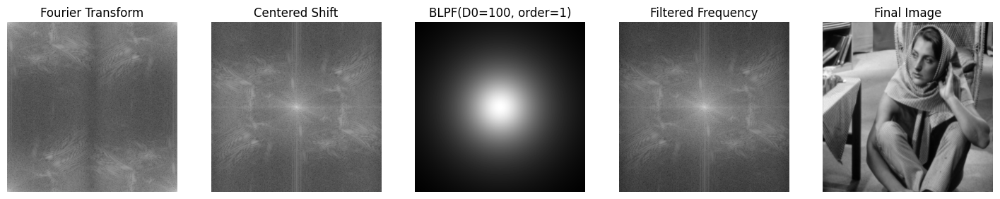

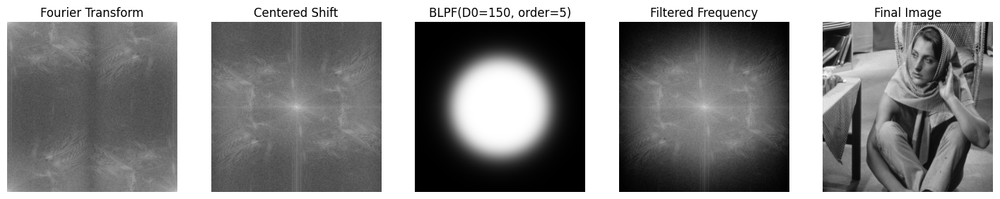

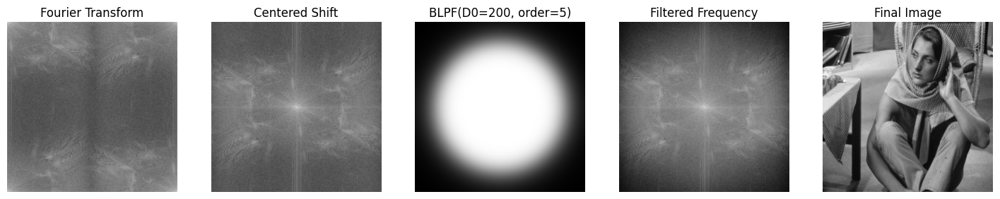

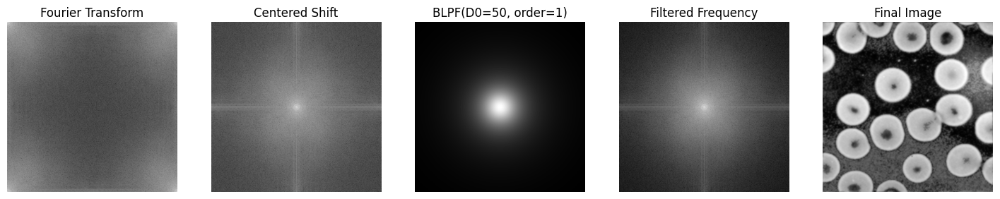

...

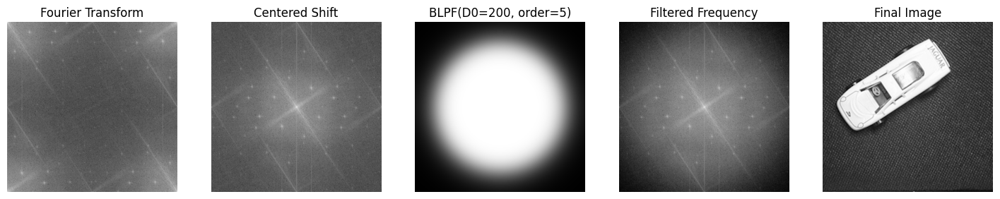

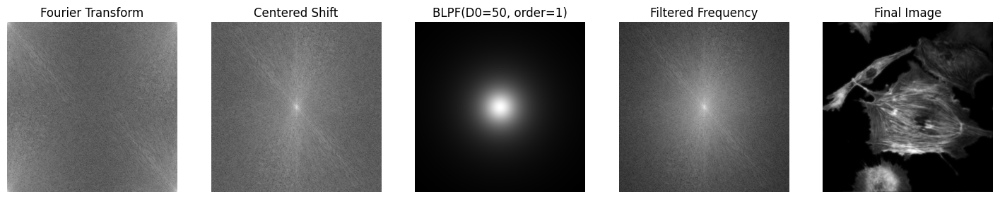

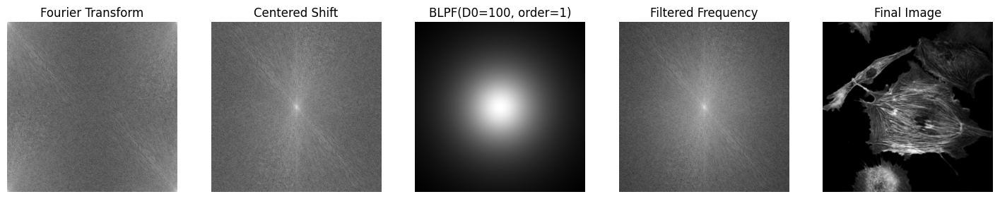

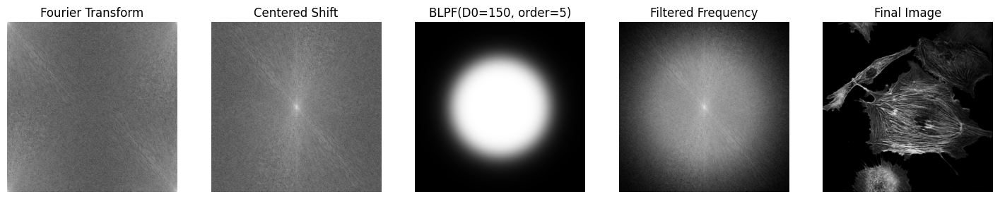

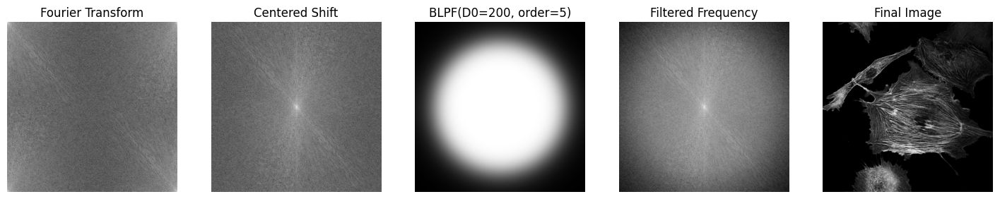

In [79]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def distance(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def butterworth_lowpass(D0: int, image_shape: tuple, order: int):
    base = np.zeros(image_shape[:2])
    rows, cols = image_shape[:2]
    center = (rows / 2, cols / 2)
    for x in range(cols):
        for y in range(rows):
            base[y, x] = 1 / (1 + (distance((y, x), center) / D0) ** (2 * order))
    return base

def calculate_metrics(original, filtered):
    psnr_value = psnr(original, filtered)
    ssim_value = ssim(original, filtered)
    return psnr_value, ssim_value

def plot_figure(images, titles, rows, cols, figsize_width, figsize_height):
    fig, axes = plt.subplots(rows, cols, figsize=(figsize_width, figsize_height))

    if rows == 1 and cols == 1:
        axes = [axes]

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    plt.show()

psnr_values = []
ssim_values = []
for i in range(len(images)):
    image = Image.open(images[i]).convert('L')
    image_array = np.array(image)

    fourier_transform = np.fft.fft2(image_array)
    center_shift = np.fft.fftshift(fourier_transform)

    for order, cutoff_frequency in zip([1, 1, 5, 5], [50, 100, 150, 200]):
        blpf = butterworth_lowpass(cutoff_frequency, image_array.shape, order)
        filtered = center_shift * blpf
        ifftshift_filtered = np.fft.ifftshift(filtered)
        final_image = np.abs(np.fft.ifft2(ifftshift_filtered))

        psnr_value, ssim_value = calculate_metrics(image_array, final_image)
        psnr_values.append(psnr_value)
        ssim_values.append(ssim_value)
        plot_figure(
            [display_freq(fourier_transform), display_freq(center_shift), blpf, display_freq(filtered), final_image],
            ['Fourier Transform', 'Centered Shift', f'BLPF(D0={cutoff_frequency}, order={order})', 'Filtered Frequency', 'Final Image'],
            1, 5, 18, 12
        )


In [80]:
for i, (psnr_value, ssim_value) in enumerate(zip(psnr_values, ssim_values), 1):
    print(f"Image {i}: PSNR = {psnr_value:.2f}, SSIM = {ssim_value:.4f}")

Image 1: PSNR = 24.45, SSIM = 0.7236
Image 2: PSNR = 26.95, SSIM = 0.8515
Image 3: PSNR = 27.43, SSIM = 0.8692
Image 4: PSNR = 33.00, SSIM = 0.9574
Image 5: PSNR = 27.04, SSIM = 0.8115
Image 6: PSNR = 32.41, SSIM = 0.9467
Image 7: PSNR = 38.58, SSIM = 0.9906
Image 8: PSNR = 43.41, SSIM = 0.9969
Image 9: PSNR = 27.55, SSIM = 0.8259
Image 10: PSNR = 32.07, SSIM = 0.9300
Image 11: PSNR = 35.34, SSIM = 0.9576
Image 12: PSNR = 40.51, SSIM = 0.9827
Image 13: PSNR = 27.21, SSIM = 0.7021
Image 14: PSNR = 32.55, SSIM = 0.9211
Image 15: PSNR = 40.87, SSIM = 0.9913
Image 16: PSNR = 46.26, SSIM = 0.9977
Image 17: PSNR = 25.04, SSIM = 0.7668
Image 18: PSNR = 28.15, SSIM = 0.8941
Image 19: PSNR = 29.71, SSIM = 0.9297
Image 20: PSNR = 33.38, SSIM = 0.9694


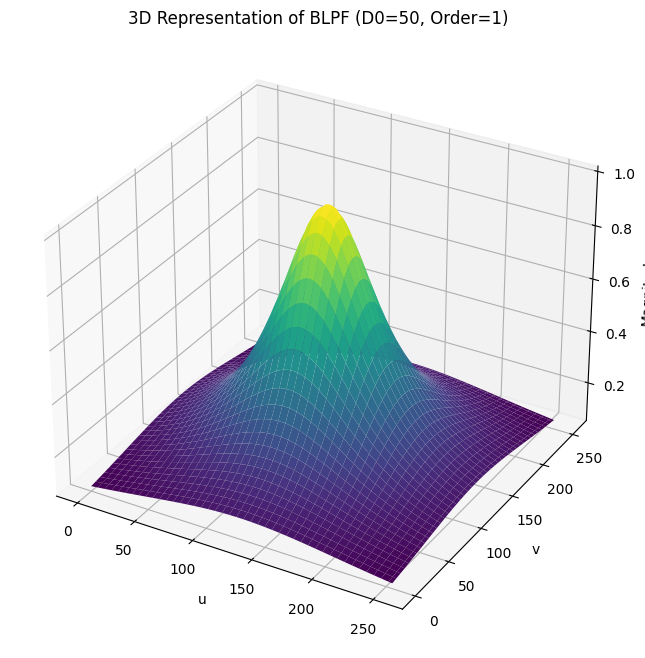

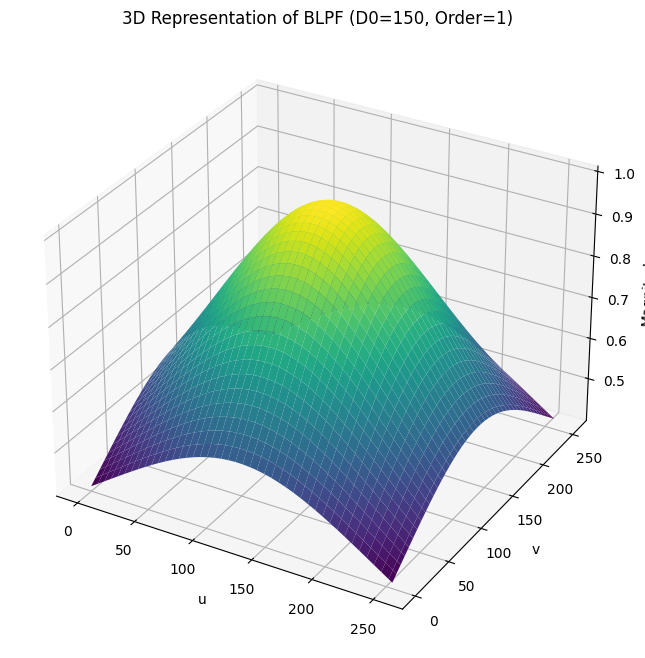

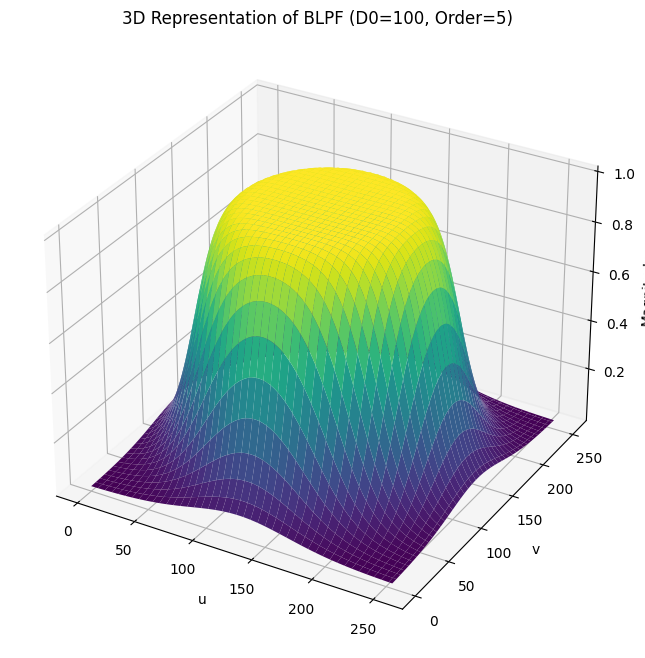

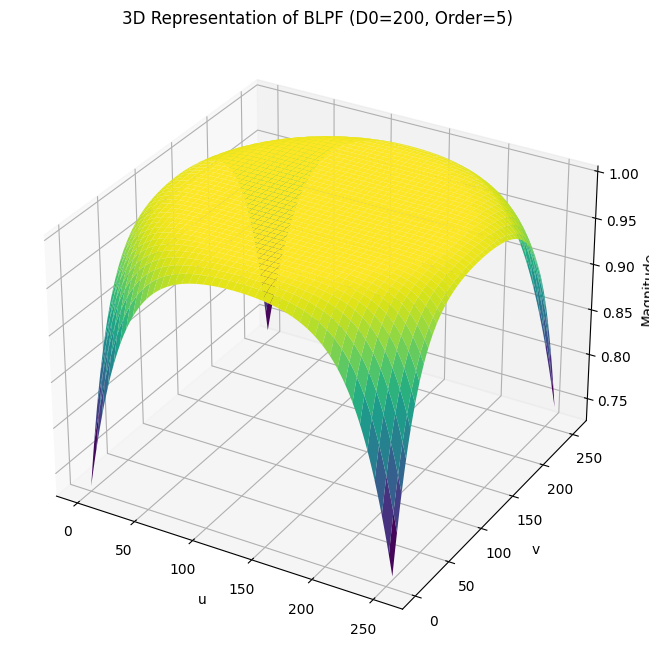

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def butterworth_lowpass_3d(D0: int, image_shape: tuple, order: int):
    rows, cols = image_shape[:2]
    center = (rows / 2, cols / 2)
    u, v = np.meshgrid(np.arange(cols), np.arange(rows))
    distance_matrix = np.sqrt((u - center[1])**2 + (v - center[0])**2)
    blpf = 1 / (1 + (distance_matrix / D0)**(2 * order))
    return blpf
D0 = 50
order = 1
image_shape = (256, 256)
blpf = butterworth_lowpass_3d(D0, image_shape, order)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
u, v = np.meshgrid(np.arange(image_shape[1]), np.arange(image_shape[0]))
ax.plot_surface(u, v, blpf, cmap='viridis')
ax.set_title(f'3D Representation of BLPF (D0={D0}, Order={order})')
ax.set_xlabel('u')
ax.set_ylabel('v')
ax.set_zlabel('Magnitude')
plt.show()

D0 = 150
order = 1
image_shape = (256, 256)
blpf = butterworth_lowpass_3d(D0, image_shape, order)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
u, v = np.meshgrid(np.arange(image_shape[1]), np.arange(image_shape[0]))
ax.plot_surface(u, v, blpf, cmap='viridis')
ax.set_title(f'3D Representation of BLPF (D0={D0}, Order={order})')
ax.set_xlabel('u')
ax.set_ylabel('v')
ax.set_zlabel('Magnitude')
plt.show()

D0 = 100
order = 5
image_shape = (256, 256)
blpf = butterworth_lowpass_3d(D0, image_shape, order)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
u, v = np.meshgrid(np.arange(image_shape[1]), np.arange(image_shape[0]))
ax.plot_surface(u, v, blpf, cmap='viridis')
ax.set_title(f'3D Representation of BLPF (D0={D0}, Order={order})')
ax.set_xlabel('u')
ax.set_ylabel('v')
ax.set_zlabel('Magnitude')
plt.show()

D0 = 200
order = 5
image_shape = (256, 256)
blpf = butterworth_lowpass_3d(D0, image_shape, order)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
u, v = np.meshgrid(np.arange(image_shape[1]), np.arange(image_shape[0]))
ax.plot_surface(u, v, blpf, cmap='viridis')
ax.set_title(f'3D Representation of BLPF (D0={D0}, Order={order})')
ax.set_xlabel('u')
ax.set_ylabel('v')
ax.set_zlabel('Magnitude')
plt.show()


Q3

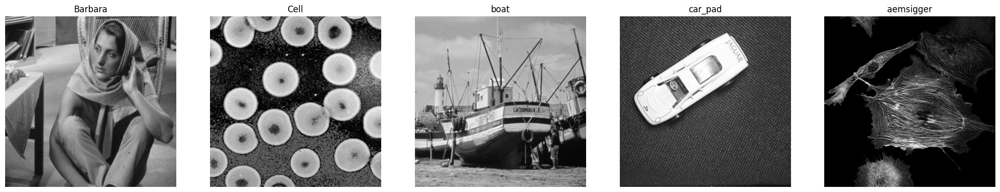

In [82]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

def plot_images(images, titles):
    num_images = len(images)
    fig, axes = plt.subplots(1, num_images, figsize=(5*num_images, 5))

    for ax, image, title in zip(axes, images, titles):
        grayscale_image = np.array(image.convert('L'))

        ax.imshow(grayscale_image, cmap='gray')
        ax.set_title(title)
        ax.axis('off')



    plt.show()

images = ['/content/barbara.png', '/content/cells.png', '/content/boats.png', '/content/car_pad.png', '/content/cell-aemisegger.png']
titles = ['Barbara', 'Cell', 'boat', 'car_pad', 'aemsigger']


loaded_images = [Image.open(image_path) for image_path in images]

plot_images(loaded_images, titles)


Periodic Noise, Gaussian Filter

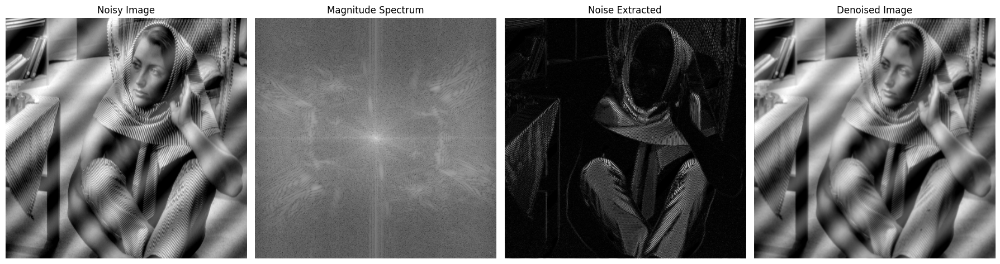

<ipython-input-89-0b93afd2f4b8>:83: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_value = psnr(np.array(original_image), denoised_image_np)


PSNR: 16.822214603857603, SSIM: 0.6326456271434752






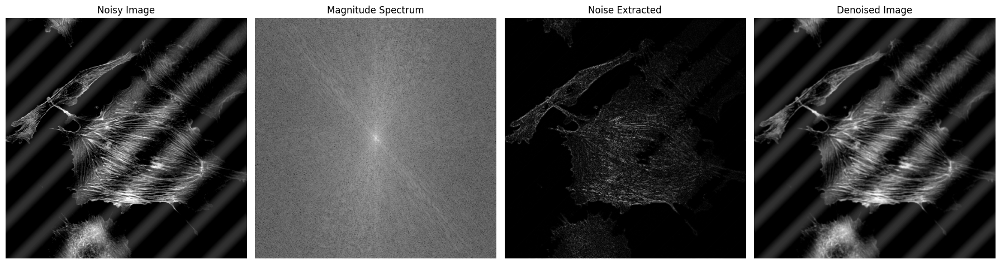

PSNR: 18.481870998027482, SSIM: 0.4943880798119456






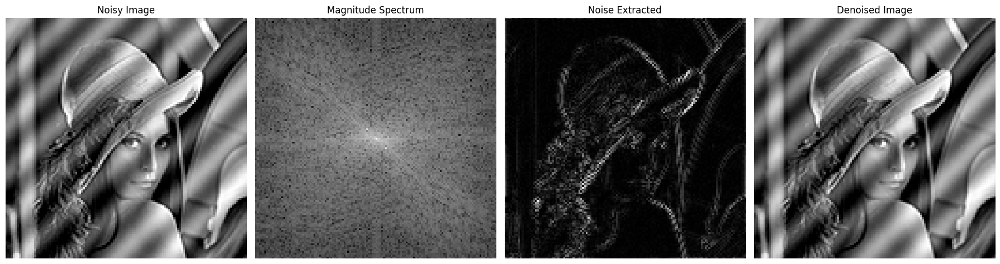

PSNR: 17.326488326935756, SSIM: 0.5624582639857946






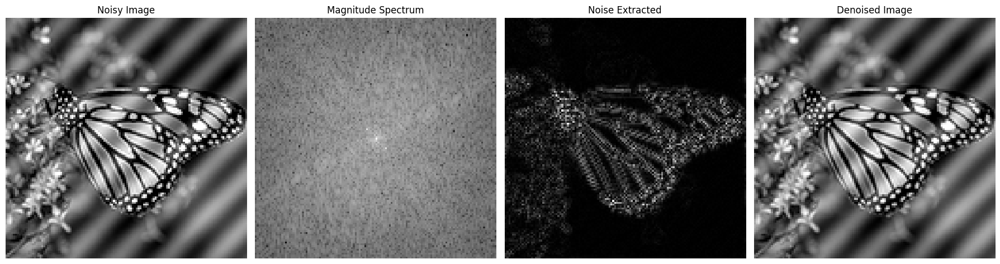

PSNR: 17.286922552466617, SSIM: 0.5737206580472145






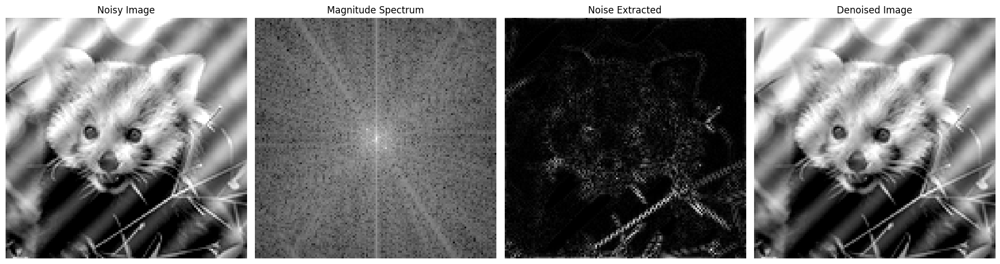

PSNR: 17.665578058778504, SSIM: 0.5418397618789208






In [89]:
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def add_periodic_noise(image, frequency=10, amplitude=50):
    np_image = np.array(image)
    h, w = np_image.shape
    x = np.arange(w)
    y = np.arange(h)
    X, Y = np.meshgrid(x, y)

    noise_pattern = amplitude * np.sin(2 * np.pi * frequency * (X + Y) / (w + h))

    noisy_image = np_image + noise_pattern

    noisy_image = np.clip(noisy_image, 0, 255)

    return Image.fromarray(np.uint8(noisy_image))

def calculate_ssim(img1, img2):
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    if img1.ndim == 2:
        return ssim(img1, img2)
    elif img1.ndim == 3:
        if img1.shape[2] == 3:
            ssims = []
            for i in range(3):
                ssims.append(ssim(img1[:, :, i], img2[:, :, i]))
            return np.array(ssims).mean()
        elif img1.shape[2] == 1:
            return ssim(np.squeeze(img1), np.squeeze(img2))
    else:
        raise ValueError('Wrong input image dimensions.')

def plot_figurea(noisy_image, mag_spectrum_noisy, noise_extracted, denoised_image, figsize_width=12, figsize_height=6):
    fig, axes = plt.subplots(1, 4, figsize=(figsize_width, figsize_height))

    noise_extracted_abs = np.abs(noise_extracted)
    denoised_image_abs = np.abs(denoised_image)

    images = [noisy_image, mag_spectrum_noisy, noise_extracted_abs, denoised_image_abs]
    titles = ['Noisy Image', 'Magnitude Spectrum', 'Noise Extracted', 'Denoised Image']

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

allnames = ['/content/barbara.png', '/content/cell-aemisegger.png', '/content/lena.png', '/content/monarch.png', '/content/panda.png']

for image_name in allnames:
    original_image = Image.open(image_name)
    noisy_image = add_periodic_noise(original_image)

    fourier_transform = np.fft.fft2(noisy_image)
    center_shift = np.fft.fftshift(fourier_transform)
    magnitude_spectrum = np.log(1 + np.abs(center_shift))

    cutoff_frequency = 100
    glpf = gaussian_lowpass(cutoff_frequency, (original_image.height, original_image.width))
    filtered = center_shift * (1 - glpf)
    ifftshift_filtered = np.fft.ifftshift(filtered)
    noise_extracted = np.fft.ifft2(ifftshift_filtered)

    cutoff_frequency = 100
    glpf = gaussian_lowpass(cutoff_frequency, (original_image.height, original_image.width))
    filtered = center_shift * glpf
    ifftshift_filtered = np.fft.ifftshift(filtered)
    denoised_image = abs(np.fft.ifft2(ifftshift_filtered))

    noisy_image_np = np.array(noisy_image).astype(np.float32)
    denoised_image_np = np.array(denoised_image).astype(np.float32)

    plot_figurea(noisy_image, magnitude_spectrum, noise_extracted, denoised_image, figsize_width=18, figsize_height=6)

    psnr_value = psnr(np.array(original_image), denoised_image_np)
    ssim_value = calculate_ssim(np.array(original_image), denoised_image_np)

    print(f"PSNR: {psnr_value}, SSIM: {ssim_value}\n\n\n\n")


SALT and PEPPER NOISE, Gaussian_lowpass filter

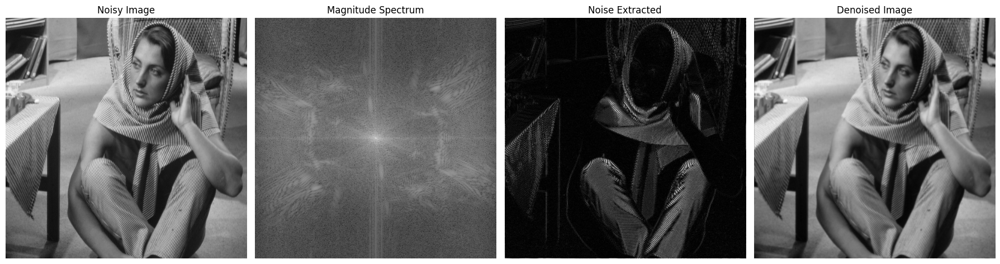

<ipython-input-91-f7e58a10ea9d>:75: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_value = psnr(np.array(original_image), denoised_image_np)


PSNR: 26.88314355136216, SSIM: 0.8492932260683075






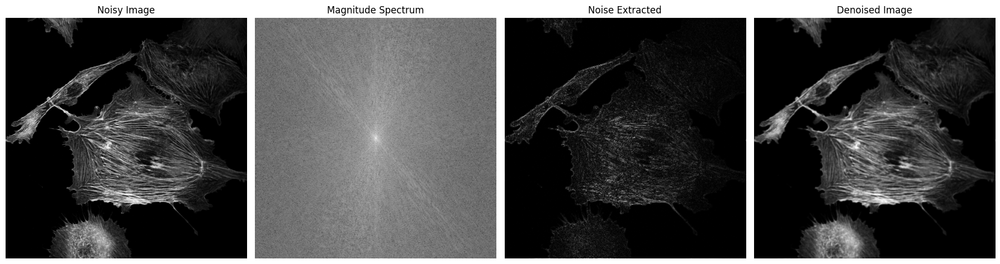

PSNR: 28.466780163075054, SSIM: 0.90354916615873






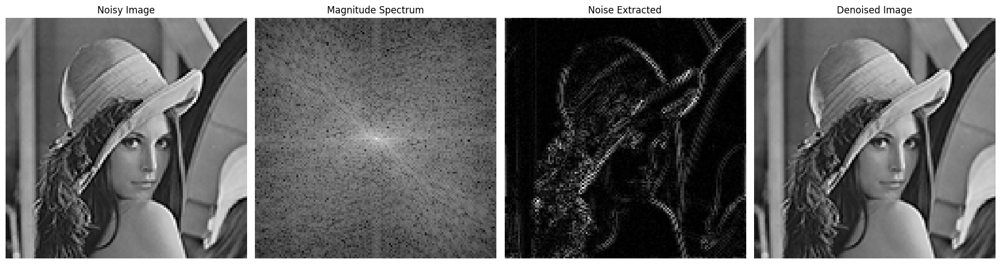

PSNR: 42.83586248922341, SSIM: 0.9973977389784863






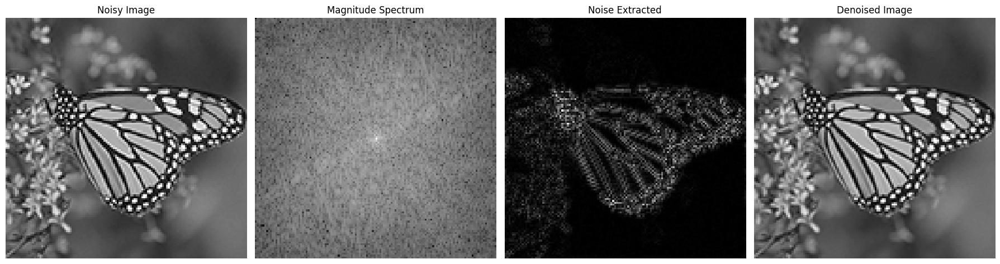

PSNR: 39.266291171346445, SSIM: 0.9974784833197945






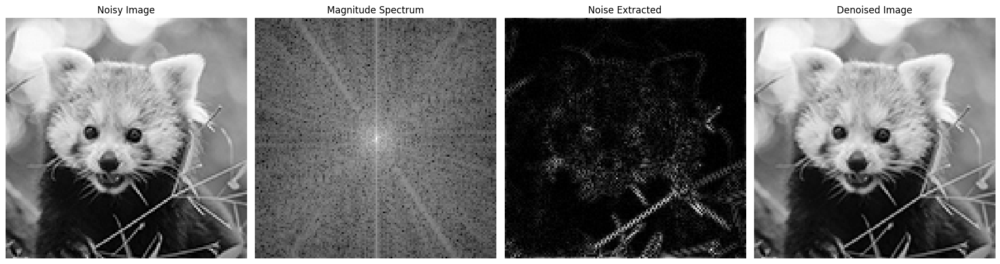

PSNR: 42.3599464820769, SSIM: 0.997303162902527






In [91]:
def add_noise(image, noise_type='gaussian', mean=0, std=25, amount=0.02):
    np_image = np.array(image)
    h, w = np_image.shape

    if noise_type == 'gaussian':
        noise = np.random.normal(mean, std, (h, w))
        noisy_image = np_image + amount * noise
    else:
        raise ValueError("Unsupported noise type. Use 'gaussian'.")

    noisy_image = np.clip(noisy_image, 0, 255)

    return Image.fromarray(np.uint8(noisy_image))

def calculate_ssim(img1, img2):
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    if img1.ndim == 2:
        return ssim(img1, img2)
    elif img1.ndim == 3:
        if img1.shape[2] == 3:
            ssims = []
            for i in range(3):
                ssims.append(ssim(img1[:, :, i], img2[:, :, i]))
            return np.array(ssims).mean()
        elif img1.shape[2] == 1:
            return ssim(np.squeeze(img1), np.squeeze(img2))
    else:
        raise ValueError('Wrong input image dimensions.')

def plot_figurea(noisy_image, mag_spectrum_noisy, noise_extracted, denoised_image, figsize_width=12, figsize_height=6):
    fig, axes = plt.subplots(1, 4, figsize=(figsize_width, figsize_height))

    noise_extracted_abs = np.abs(noise_extracted)
    denoised_image_abs = np.abs(denoised_image)

    images = [noisy_image, mag_spectrum_noisy, noise_extracted_abs, denoised_image_abs]
    titles = ['Noisy Image', 'Magnitude Spectrum', 'Noise Extracted', 'Denoised Image']

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

allnames = ['/content/barbara.png', '/content/cell-aemisegger.png', '/content/lena.png', '/content/monarch.png', '/content/panda.png']

for image_name in allnames:
    original_image = Image.open(image_name)
    noisy_image = add_noise(original_image)

    fourier_transform = np.fft.fft2(noisy_image)
    center_shift = np.fft.fftshift(fourier_transform)
    magnitude_spectrum = np.log(1 + np.abs(center_shift))

    cutoff_frequency = 100
    glpf = gaussian_lowpass(cutoff_frequency, (original_image.height, original_image.width))
    filtered = center_shift * (1 - glpf)
    ifftshift_filtered = np.fft.ifftshift(filtered)
    noise_extracted = np.fft.ifft2(ifftshift_filtered)

    cutoff_frequency = 100
    glpf = gaussian_lowpass(cutoff_frequency, (original_image.height, original_image.width))
    filtered = center_shift * glpf
    ifftshift_filtered = np.fft.ifftshift(filtered)
    denoised_image = abs(np.fft.ifft2(ifftshift_filtered))

    noisy_image_np = np.array(noisy_image).astype(np.float32)
    denoised_image_np = np.array(denoised_image).astype(np.float32)

    plot_figurea(noisy_image, magnitude_spectrum, noise_extracted, denoised_image, figsize_width=18, figsize_height=6)

    psnr_value = psnr(np.array(original_image), denoised_image_np)
    ssim_value = calculate_ssim(np.array(original_image), denoised_image_np)

    print(f"PSNR: {psnr_value}, SSIM: {ssim_value}\n\n\n\n")